# A Look Into Common Crawl Google Scholar Alerts 2016 – Present

Academic articles and publications mentioning Common Crawl are extracted from [Google Scholar](https://scholar.google.com/) alert mails received from April 2016 to date. This notebook tries to get some insights from the publications contained in the alert emails.

In [1]:
import pandas as pd

df = pd.read_json('citations.jsonl', lines=True)
df.shape

(4216, 5)

In [2]:
# citations per year (first and last year incomplete)

df['year'].value_counts(sort=False)

2016     196
2017     316
2018     533
2019     710
2020     977
2021    1105
2022     379
Name: year, dtype: int64

## Key terms used in publication titles and snippets

In [3]:
from collections import Counter, defaultdict

from stop_words import get_stop_words

stop_words = set(get_stop_words('en'))
# add stop words specific for the selection and citations in general
# including ngram stop words
stop_words.update(['common', 'crawl', 'common crawl', 'commoncrawl',
                   'the common crawl', 'the common', 'common crawl corpus',
                   'crawl corpus',
                   '…', '...', 'et al.', 'et al.,', 'et', 'al.', 'al.,',
                   'of the', 'on the', 'in the', 'from the', 'for the',
                   '… the', '… we', 'and the', '… for', 'in this', 'in a',
                   'university of', 'page 1.', 'we use the',
                   '(pennington et al.,', 'et al., 2014)', 'skip to main',
                   '1.', '2.', '3.'])

def word_and_ngrams(tokens, ngram_length=1):
    if ngram_length == 1:
        return tokens
    return [' '.join(tokens[i:i + j])
            for j in range(1, ngram_length)
            for i in range(len(tokens) - ngram_length + 1)]

def word_counts(citations, ngram_length=1):
    words = Counter()
    for c in citations:
        for t in [c['title'], c['snippet']]:
            tokens = str(t).split(' ')
            for word in word_and_ngrams(tokens, ngram_length):
                word = word.lower()
                if word in stop_words:
                    continue
                words[word] += 1
    return words

wc = word_counts(df.to_records(), 2)

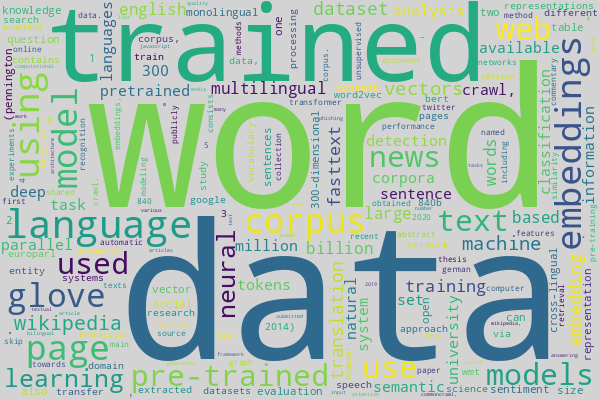

In [11]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=600, height=400,
                      background_color='lightgrey') \
                .generate_from_frequencies(wc)

wordcloud.to_image()

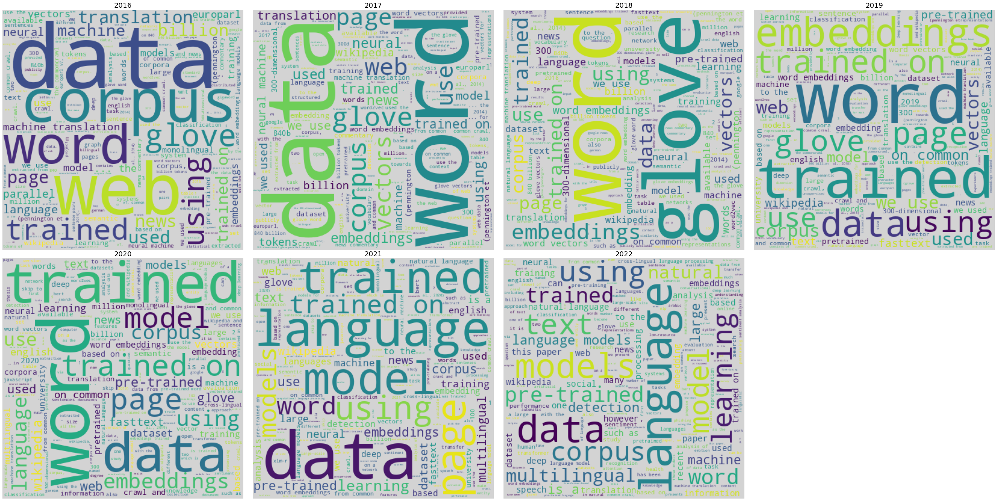

In [5]:
import math
import matplotlib.pyplot as plt

years = [2016, 2017, 2018, 2019, 2020, 2021, 2022]


def word_clouds(data, ncols=4, width=400, height=400):

    nrows = math.ceil(len(data)/ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=[int(ncols*(10.0*width/height)),
                                      nrows*10])

    n = 0
    for sub in data:
        wordcloud = WordCloud(width=width, height=height,
                              background_color='lightgrey') \
                        .generate_from_frequencies(data[sub])
        axis = axes[int(n/ncols),n%ncols]
        axis.imshow(wordcloud)
        axis.set_title(str(sub), fontsize=20)
        axis.axis('off') # do not show x/y scale
        n += 1

    # fill the grid with empty subplots
    while n < (ncols*nrows):
        axes[int(n/ncols),n%ncols].axis('off') # do not show x/y scale
        n += 1

    fig.set_tight_layout(True)
    return fig

word_frequencies_by_year = dict()
for year in years:
    word_frequencies_by_year[year] = word_counts(df[df['year']==year].to_records(), 3)

fig = word_clouds(word_frequencies_by_year)
plt.show()

In [6]:
def row_to_text(row, cols=['title', 'snippet']):
    text = ''
    for col in cols:
        if text:
            text += '\t'
        text += str(row[col]).lower()
    return text
    
def df_to_corpus(df, cols=['title', 'snippet']):
    corpus = []
    for row in df.to_records():
        corpus.append(row_to_text(row))
    return '\n'.join(corpus)

In [7]:
# keyword extraction over all citations (title and snippet)

import yake

kwex = yake.KeywordExtractor(lan='en', n=3, dedupLim=1.0, top=40, features=None)
kwex.stopword_set.update(stop_words)

terms = dict()
docs_by_year = Counter()
terms_by_year = Counter()

for row in df.to_records():
    year = row['year']
    docs_by_year[year] += 1
    text = row_to_text(row).lower()
    for kw in kwex.extract_keywords(text):
        (score, term) = kw
        if score < .0:
            # bug in yake: negative scores if n>3, see https://github.com/LIAAD/yake/issues/17
            continue
        terms_by_year[year] += 1
        if term in terms:
            terms[term][0] += 1
            terms[term][1] += score
            terms[term][2][year] += 1
        else:
            terms[term] = [1, score, Counter({year: 1})]

In [8]:
# rank terms by a combination of tf*idf and Yake's score

ranked_terms = dict()

for term in terms:
    (doc_freq, sum_score, yearly_counts) = terms[term]
    avg_score = sum_score / doc_freq
    for year in yearly_counts:
        frq = yearly_counts[year]
        if frq < 4:
            continue
        tf = (frq / terms_by_year[year])
        idf = math.log2(len(docs_by_year) / len(yearly_counts))
        if idf == .0:
            continue
        score = tf * idf - avg_score
        ranked_terms[(year, '%5d %.5f %.5f %.5f %.5f' % (frq, tf, idf, tf*idf, avg_score), term)] = score

ranked_terms = {k: v for k, v in sorted(ranked_terms.items(), key=lambda item: item[1], reverse=True)}

best_by_year = defaultdict(dict)
for year in docs_by_year:
    terms_of_year = list(filter(lambda i: i[0][0] == year, ranked_terms.items()))
    for t in terms_of_year[0:20]:
        print(t)
    for t in terms_of_year[0:150]:
        best_by_year[year][t[0][2]] = t[1]

((2016, '    7 0.00101 0.48543 0.00049 0.02241', 'statistical machine translation'), -0.021918002266064527)
((2016, '    7 0.00101 0.48543 0.00049 0.07104', 'statistical machine'), -0.07055160110518888)
((2016, '    5 0.00072 0.22239 0.00016 0.13980', 'data sets'), -0.1396376155844415)
((2016, '    4 0.00058 0.22239 0.00013 0.16007', 'fast'), -0.15993935421488165)
((2016, '    4 0.00058 0.22239 0.00013 0.16724', 'tiedemann'), -0.16710737743430526)
((2016, '    6 0.00087 0.22239 0.00019 0.17136', 'billion web pages'), -0.1711641470047385)
((2016, '    7 0.00101 0.22239 0.00022 0.18290', 'sentence pairs'), -0.18267026620396237)
((2016, '    4 0.00058 0.22239 0.00013 0.18309', 'web corpus'), -0.182963187576375)
((2016, '   34 0.00491 0.22239 0.00109 0.18414', 'page'), -0.1830505852220329)
((2016, '    4 0.00058 0.22239 0.00013 0.19369', 'web corpora'), -0.19355835171603278)
((2016, '    8 0.00116 0.22239 0.00026 0.19543', 'koehn'), -0.19517704571118646)
((2016, '    4 0.00058 0.22239 0.00

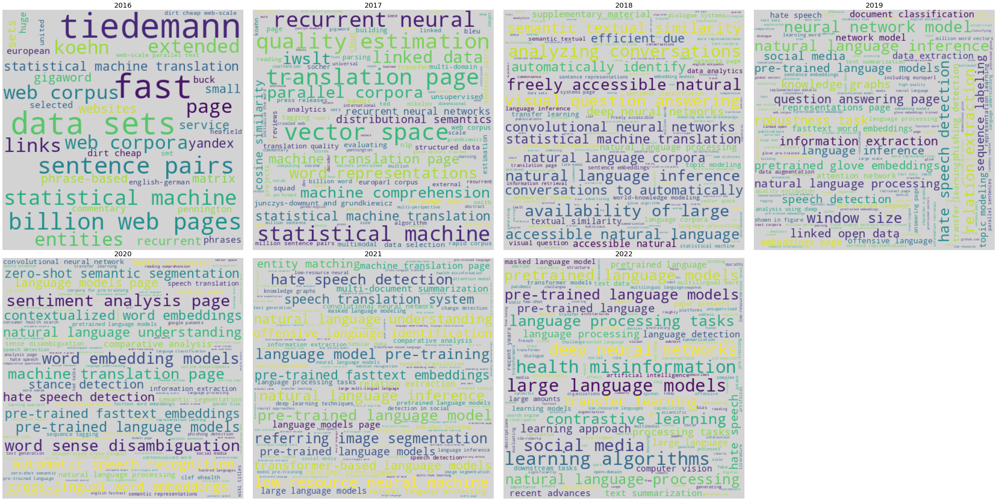

In [9]:
fig = word_clouds(best_by_year, 4, 400, 400)
plt.show()

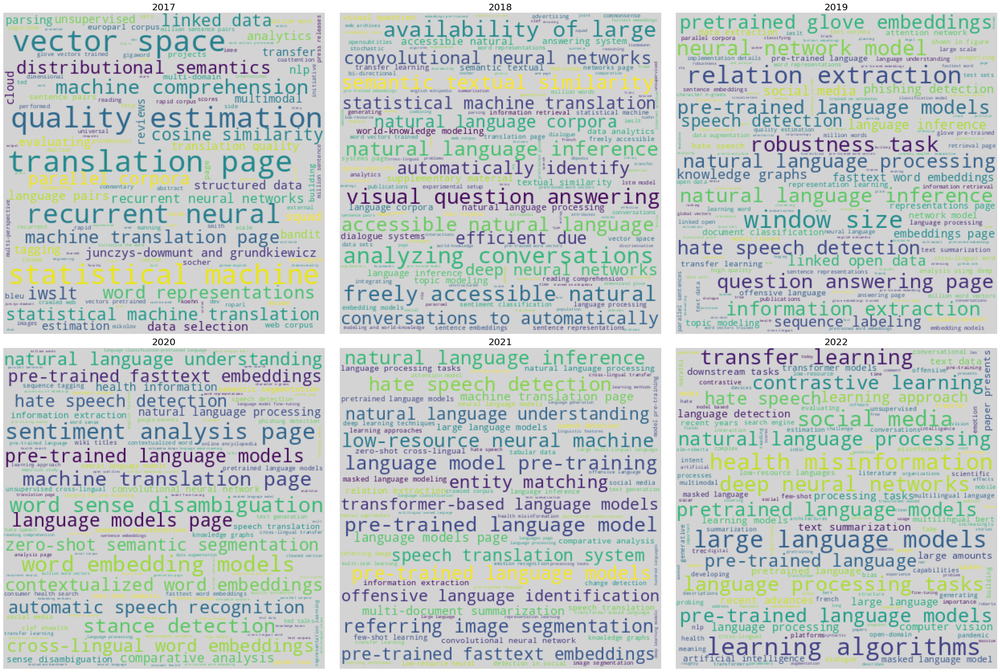

In [10]:
del(best_by_year[2016])
fig = word_clouds(best_by_year, 3, 400, 400)
plt.show()